In [71]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import plotly.express as px
import plotly

%matplotlib inline

with open('.mapbox_token', 'r') as f:
    px.set_mapbox_access_token(f.read())

In [2]:
from utils import haversine_np

In [3]:
%%time
df = pd.read_csv('https://s3.amazonaws.com/arrivalist-puzzles/interview_data.csv.zip', parse_dates=['ts'])

<string>:2: DtypeWarning:

Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.



CPU times: user 22.1 s, sys: 2.35 s, total: 24.4 s
Wall time: 29.6 s


# Some Initial Features

We will compute observational segments, distance between observations, time between observations, and implied velocity.

In [8]:
%%time

time_diffs = df.groupby('device_id').apply(lambda grp: grp.ts.diff())
df['td'] = time_diffs.droplevel(0).dt.total_seconds().div(60)

# define an observational segment as a sequence of observations for a given device with no more than 11 minutes between any two
segment_boundaries = (df.td > 11) | (df.device_id != df.shift(1).device_id)
df['at_boundary'] = segment_boundaries
df['segment'] = df.at_boundary.cumsum()

df['dist'] = haversine_np(df.lon, df.lat, df.lon.shift(1), df.lat.shift(1))
df.loc[df.at_boundary, 'dist'] = np.nan
df['td_raw'] = df.td.copy()
df.loc[df.at_boundary, 'td'] = np.nan

df['mph'] = df.dist / df.td.div(60)

CPU times: user 11.8 s, sys: 4.46 s, total: 16.2 s
Wall time: 13.1 s


In [9]:
df.segment.nunique()

803260

We have a little over 800k observational segments.

# Basic EDA

We have about 16 million records of location observations, spanning the full year of 2018, for 1,089 users. Almost all observations are in the USA.

It is a little odd that we wouldn't have the publisher_id for almost half of the observations, but there doesn't seem to be any systematic difference between records that haven't and those that don't.

## First Look

In [9]:
print(df.shape)
display(df.head())
display(df.describe(include='all'))
display(df.isnull().sum())

(16125354, 19)


,device_id,ts,ts_date,ts_quarter,lat,lon,geohash5,country,region,city,zip_code,publisher_id,partner_id,td,at_boundary,segment,dist,td_raw,mph
0,1,2018-01-02 18:10:01,2018-01-02,2018-01-01,38.70031,-90.47151,9yzsj,usa,mo,st louis,63146,5009.0,1,NaN,True,1,NaN,NaN,NaN
1,1,2018-01-02 18:10:02,2018-01-02,2018-01-01,38.70051,-90.47162,9yzsj,usa,mo,st louis,63146,5009.0,1,0.016667,False,1,0.015028,0.016667,54.102326
2,1,2018-01-02 18:29:06,2018-01-02,2018-01-01,38.73263,-90.67430,9yzs2,usa,mo,st charles,63304,5009.0,1,NaN,True,2,NaN,19.066667,NaN
3,1,2018-01-02 18:29:11,2018-01-02,2018-01-01,38.73261,-90.67434,9yzs2,usa,mo,st charles,63304,5009.0,1,0.083333,False,2,0.002559,0.083333,1.842595
4,1,2018-01-02 18:29:13,2018-01-02,2018-01-01,38.73261,-90.67434,9yzs2,usa,mo,st charles,63304,5009.0,1,0.033333,False,2,0.000000,0.033333,0.000000


,device_id,ts,ts_date,ts_quarter,lat,lon,geohash5,country,region,city,zip_code,publisher_id,partner_id,td,at_boundary,segment,dist,td_raw,mph
count,1.612535e+07,16125354,16125354,16125354,1.612535e+07,1.612535e+07,16125354,16125354,16125354,16125354,16125354.0,8.913284e+06,1.612535e+07,1.532209e+07,16125354,1.612535e+07,1.532209e+07,1.612426e+07,1.154143e+07
unique,NaN,7574461,365,4,NaN,NaN,32386,72,206,7734,19974.0,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN
top,NaN,2018-02-09 12:31:42,2018-05-04,2018-01-01,NaN,NaN,dppjs,usa,ca,pittsburgh,15227.0,NaN,NaN,NaN,False,NaN,NaN,NaN,NaN
freq,NaN,388,99332,5215057,NaN,NaN,427624,16000586,2306273,518945,369436.0,NaN,NaN,NaN,15322094,NaN,NaN,NaN,NaN
first,NaN,2018-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,2018-12-31 23:59:40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2.020161e+03,NaN,NaN,NaN,3.717414e+01,-9.263365e+01,NaN,NaN,NaN,NaN,NaN,9.674115e+17,1.686466e+00,6.843172e-01,NaN,3.349354e+05,1.783964e-01,2.164132e+01,inf
std,8.408644e+03,NaN,NaN,NaN,5.339480e+00,1.862537e+01,NaN,NaN,NaN,NaN,NaN,2.393162e+18,6.741262e-01,2.005045e+00,NaN,2.161779e+05,1.160641e+01,1.046697e+03,NaN
min,1.000000e+00,NaN,NaN,NaN,-3.807455e+01,-1.597172e+02,NaN,NaN,NaN,NaN,NaN,1.003000e+03,1.000000e+00,0.000000e+00,NaN,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.050000e+02,NaN,NaN,NaN,3.397732e+01,-9.848565e+01,NaN,NaN,NaN,NaN,NaN,1.156000e+03,1.000000e+00,0.000000e+00,NaN,1.528790e+05,0.000000e+00,0.000000e+00,0.000000e+00


device_id             0
ts                    0
ts_date               0
ts_quarter            0
lat                   0
lon                   0
geohash5              0
country               0
region                0
city                  0
zip_code              0
publisher_id    7212070
partner_id            0
td               803260
at_boundary           0
segment               0
dist             803260
td_raw             1089
mph             4583924
dtype: int64

## Simple Counts

In [10]:
df.device_id.nunique()

1089

In [11]:
df.publisher_id.nunique()

107

In [12]:
df.partner_id.nunique()

3

In [13]:
df.partner_id.value_counts(normalize=True)

2    0.447250
1    0.433142
3    0.119608
Name: partner_id, dtype: float64

In [10]:
df.country.value_counts(normalize=True).round(3).head()

usa    0.992
pri    0.004
irn    0.001
tur    0.001
nga    0.001
Name: country, dtype: float64

## Missing publisher_id

In [15]:
df.loc[df.publisher_id.isnull()].device_id.nunique()

1086

Almost all users have some observations with a null publisher_id.

In [16]:
df.groupby(df.publisher_id.isnull())[['lat', 'lon']].mean()

,lat,lon
publisher_id,,
False,37.161048,-92.499286
True,37.190309,-92.799706


The coordinates don't seem to differ much based on whether we have the publisher_id.

## "Duplicate" observations

Below, we see that we frequently have many observations for the same device at the same time. This may be partly due to the fact that the `ts` field is truncated to the second. Furthermore, for the most part these "duplicate" observations map to the same geohash, implying that they are fairly consistent. However, there are some cases where the observations are not consistent with each other.

### Identify "Duplicates"

In [17]:
vc = df.groupby(['device_id', 'ts']).size().sort_values(ascending=False)

vc.head()

device_id  ts                 
1188       2018-02-09 12:31:42    387
           2018-03-02 15:56:21    122
           2018-03-02 14:38:29    119
           2018-03-02 13:55:43    115
           2018-02-23 13:43:12    112
dtype: int64

In [19]:
vc[vc > 1].index.get_level_values(0).nunique()

1073

Almost all users have some duplicate observations for the same ts value.

In [20]:
df.loc[df.device_id.isin([1530]) & df.ts.isin(['2018-05-30 09:54:56'])]

,device_id,ts,ts_date,ts_quarter,lat,lon,geohash5,country,region,city,zip_code,publisher_id,partner_id,td,at_boundary,segment,dist,td_raw,mph
14332828,1530,2018-05-30 09:54:56,2018-05-30,2018-04-01,28.6278,-81.3631,djn4u,usa,fl,maitland,32751,NaN,2,9.75,False,649881,3.752619,9.75,23.093039
14332829,1530,2018-05-30 09:54:56,2018-05-30,2018-04-01,28.6278,-81.3631,djn4u,usa,fl,maitland,32751,1154.0,1,0.00,False,649881,0.000000,0.00,NaN


In this case, it appears that we have the same location observation from two different data providers -- one of which didn't give us the publisher_id.

In [21]:
df.loc[df.device_id.isin([56948]) & df.ts.isin(['2018-02-10 04:55:18'])]

,device_id,ts,ts_date,ts_quarter,lat,lon,geohash5,country,region,city,zip_code,publisher_id,partner_id,td,at_boundary,segment,dist,td_raw,mph
15962474,56948,2018-02-10 04:55:18,2018-02-10,2018-01-01,33.693694,-117.39651,9mux8,usa,ca,lake elsinore,92530,5.955690e+17,3,1.533333,False,788572,0.000000,1.533333,0.0
15962475,56948,2018-02-10 04:55:18,2018-02-10,2018-01-01,33.693690,-117.39651,9mux8,usa,ca,lake elsinore,92530,1.003000e+03,1,0.000000,False,788572,0.000276,0.000000,inf


Now we have almost-identical coordinates from different data sources indicating different partners.

### Compare Geohashes

Let's check to see how many geohashes are associated with each duplicate observation, to see how reliable they are.

In [11]:
n_hashes = df.groupby(['device_id', 'ts']).geohash5.nunique().sort_values(ascending=False)
n_hashes.value_counts()

1     9216681
2       30321
3         690
4          40
26          1
6           1
5           1
Name: geohash5, dtype: int64

There are a few cases where the duplicate observations have different geohashes, but by and large they are consistent. Let's look at an example where they aren't.

In [12]:
n_hashes.head()

device_id  ts                 
1188       2018-02-09 12:31:42    26
           2018-04-12 16:00:11     6
636        2018-09-08 21:57:26     5
1910       2018-11-18 16:04:59     4
1188       2018-03-02 13:55:43     4
Name: geohash5, dtype: int64

In [13]:
outlier = df.loc[df.device_id.isin([636]) & df.ts.isin(['2018-09-08 21:57:26'])]
outlier

,device_id,ts,ts_date,ts_quarter,lat,lon,geohash5,country,region,city,zip_code,publisher_id,partner_id,td,at_boundary,segment,dist,td_raw,mph
11183540,636,2018-09-08 21:57:26,2018-09-08,2018-07-01,28.513710,-99.247064,9v16j,usa,tx,cotulla,78014,9.153270e+18,3,0.033333,False,438986,60.601026,0.033333,1.090818e+05
11183541,636,2018-09-08 21:57:26,2018-09-08,2018-07-01,28.548834,-99.257212,9v16m,usa,tx,cotulla,78014,9.153270e+18,3,0.000000,False,438986,2.502222,0.000000,inf
11183542,636,2018-09-08 21:57:26,2018-09-08,2018-07-01,28.613727,-99.275962,9v16u,usa,tx,dilley,78017,9.153270e+18,3,0.000000,False,438986,4.622840,0.000000,inf
11183543,636,2018-09-08 21:57:26,2018-09-08,2018-07-01,28.733623,-99.310603,9v17k,usa,tx,dilley,78017,9.153270e+18,3,0.000000,False,438986,8.540662,0.000000,inf
11183544,636,2018-09-08 21:57:26,2018-09-08,2018-07-01,28.955140,-99.374605,9v1kd,usa,tx,pearsall,78061,9.153270e+18,3,0.000000,False,438986,15.777970,0.000000,inf
11183545,636,2018-09-08 21:57:26,2018-09-08,2018-07-01,28.484410,-99.238598,9v16j,usa,tx,cotulla,78014,9.153270e+18,3,0.000000,False,438986,33.531059,0.000000,inf
11183546,636,2018-09-08 21:57:26,2018-09-08,2018-07-01,28.494699,-99.241571,9v16j,usa,tx,cotulla,78014,9.153270e+18,3,0.000000,False,438986,0.733007,0.000000,inf


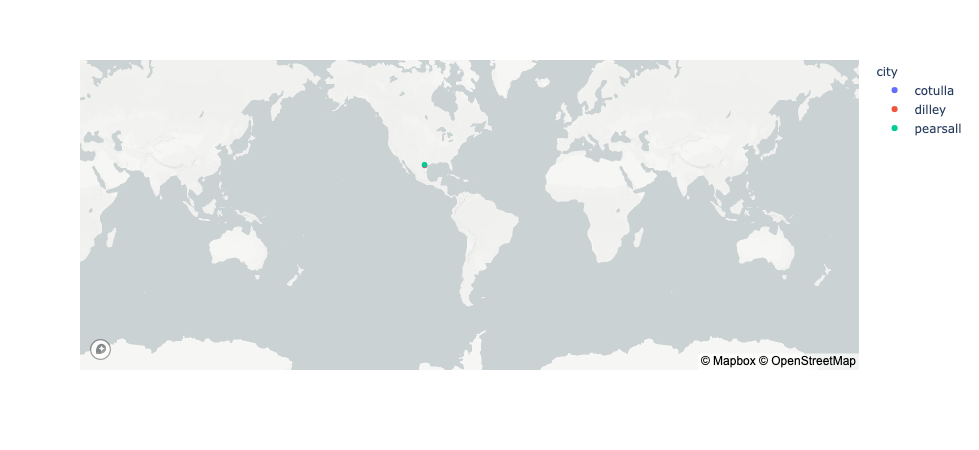

In [31]:
import plotly.express as px

px.scatter_mapbox(outlier, lon='lon', lat='lat', color='city')

It's not clear what's going on here. The observations are pretty far from each other, although they do appear to form a straight line. Perhaps there is a data collection issue here.

Another device, not visualized above, had most observations in MO, but a few in Iran on the same day. Since they obviously didn't travel to/from Iran within the span of a few minutes, there is clearly a data quality issue here. This kind of issue can be caught with the computed velocity of an observation.

## Observation Density

How frequently do we get observations for a given user? Below, we see that most users have observations spanning at least 6 of the 12 months provided, and at least 200 observations.

In [22]:
df.device_id.value_counts().describe(percentiles=np.linspace(0,1,11)).astype(int)

count      1089
mean      14807
std       40565
min           1
0%            1
10%         206
20%         354
30%         569
40%         899
50%        1535
60%        2702
70%        5059
80%       15124
90%       38192
100%     560160
max      560160
Name: device_id, dtype: int64

The vast majority of users have at least 200 observations.

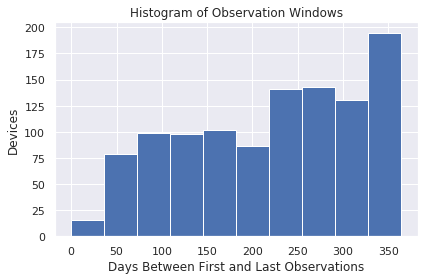

In [16]:
df.groupby('device_id').ts.agg(['min', 'max']).diff(axis=1)['max'].dt.days.hist()
plt.title('Histogram of Observation Windows')
plt.xlabel('Days Between First and Last Observations')
plt.ylabel('Devices')
plt.tight_layout()

Most users have at least 6 months between their first and last observations.

count    16124265.00
mean           21.64
std          1046.70
min             0.00
0%              0.00
10%             0.00
20%             0.00
30%             0.00
40%             0.00
50%             0.03
60%             0.08
70%             0.08
80%             0.35
90%             5.15
100%       467949.63
max        467949.63
Name: td_raw, dtype: float64

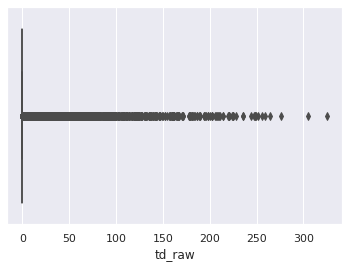

In [30]:
display(df.td_raw.describe(percentiles=np.linspace(0,1,11)).round(2))
sns.boxplot(df.td_raw.div(60*24))

For the most part, observations seem to be fairly dense -- the vast majority came within 5 minutes of the previous one for the same device. However, there are some outliers indicating gaps:

In [31]:
df.loc[df.td_raw.div(60*24) > 300]

,device_id,ts,ts_date,ts_quarter,lat,lon,geohash5,country,region,city,zip_code,publisher_id,partner_id,td,at_boundary,segment,dist,td_raw,mph
8877314,401,2018-11-22 18:53:26,2018-11-22,2018-10-01,37.522857,-84.805488,dnetq,usa,ky,stanford,40484,NaN,2,NaN,True,323880,NaN,467949.633333,NaN
15775105,35475,2018-12-17 04:13:41,2018-12-17,2018-10-01,34.090000,-118.294400,9q5cu,usa,ca,los angeles,90029,NaN,2,NaN,True,768572,NaN,438574.116667,NaN


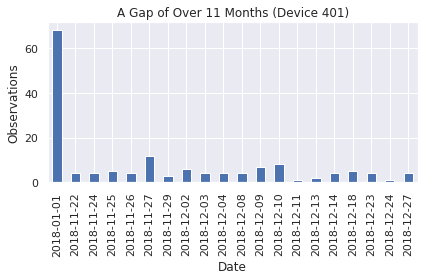

In [35]:
df.loc[df.device_id == 401].groupby('ts_date').size().sort_index().plot(kind='bar')
plt.title('A Gap of Over 11 Months (Device 401)')
plt.xlabel('Date')
plt.ylabel('Observations')
plt.tight_layout()

This user saw many observations on January 1, but none again until late November. This could be a useful feature to indicate how good a user is, since we would prefer to have consistent observations.

## Example Device

Let's take a look at the observations for a sample device to get a feel for the data.

In [46]:
sample_device = df.device_id.drop_duplicates().sample(1, random_state=42).values

In [48]:
len(df.loc[df.device_id.isin(sample_device)])

8185

In [38]:
def plot_device(device_id):
    device_data = df.loc[df.device_id == device_id]
    fig = px.scatter_mapbox(
        device_data, 
        lon='lon', 
        lat='lat', 
        color='segment', #device_data['ts'].astype('int64')//1e9,
        hover_name='ts',
        hover_data=['geohash5'],
#         color_continuous_scale=plotly.colors.sequential.tempo,
        mapbox_style='dark'
    )
    return fig

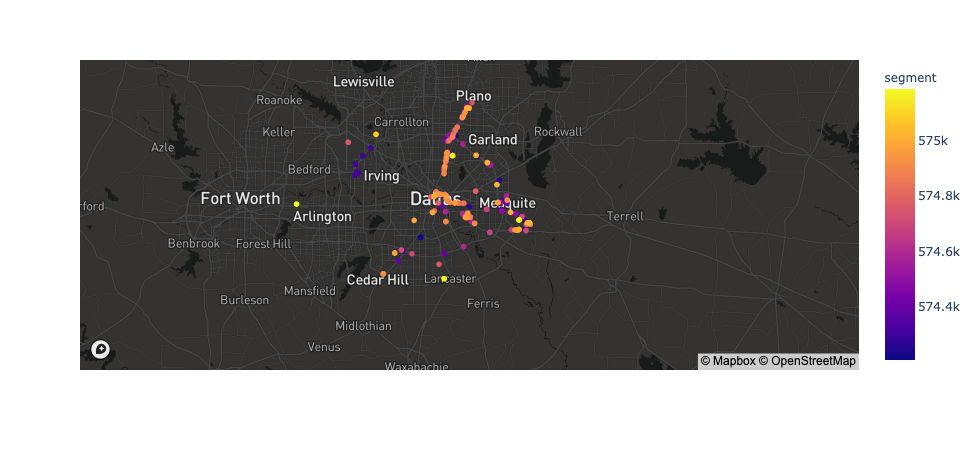

In [49]:
plot_device(sample_device[0])

This user clearly lives in or near Dallas, TX. A few clusters can be observed: one to the southeast which may be a home based on the neighborhood, and one to the northeast which may be their workplace. There are a couple of smaller clusters near schools, indicating that this may be a parent.

# Identifying Good Users

To identify good users, let's make use of some observations above. We would prefer users who have higher observation density, implying more days with observations and a higher rate of observations per day. We also would prefer to minimize the number of quasi-duplicate observations and, if these exist, especially minimize quasi-duplicates which have different geohashes. We would also like to minimize the number of observations with a computed velocity greater than 100mph compared to the previous observation, as this could indicate noise or other issues (such as usage of a VPN).

In [54]:
device_features = pd.DataFrame([], index=df.device_id.drop_duplicates())

In [55]:
device_features['n_obs'] = df.groupby('device_id').size()

In [56]:
device_features['first_obs'] = df.groupby('device_id').ts.min()
device_features['last_obs'] = df.groupby('device_id').ts.max()
device_features['window_days'] = (device_features.last_obs - device_features.first_obs).dt.days + 1

In [57]:
device_features['n_obs_mph_gt_100'] = df.groupby('device_id').apply(lambda grp: (grp.mph > 100).sum())
device_features['pct_gt_100'] = device_features.n_obs_mph_gt_100.div(device_features.n_obs)

device_features['days_w_obs'] = df.groupby('device_id').ts_date.nunique()
device_features['pct_days_w_obs'] = device_features.days_w_obs.div(device_features.window_days)
device_features['pct_days_wo_obs'] = 1 - device_features.pct_days_w_obs

In [59]:
device_features['n_unique_obs'] = df.groupby('device_id').apply(lambda grp: len(grp[['lat', 'lon']].drop_duplicates()))
device_features['pct_duplicate_obs'] = 1 - device_features.n_unique_obs.div(device_features.n_obs)

gb = df.groupby(['device_id', 'ts']).geohash5.nunique()
device_features['n_obs_same_time_different_geohash'] = (gb > 1).groupby('device_id').sum()
device_features['pct_obs_same_time_different_geohash'] = device_features.n_obs_same_time_different_geohash.div(device_features.n_obs)

In [61]:
# since every other quality factor is a loss, convert observations per day to a loss also
device_features['n_obs_per_day_neg'] = (-1)*device_features.n_obs.div(device_features.window_days)

features = ['pct_duplicate_obs', 'pct_days_wo_obs', 'pct_obs_same_time_different_geohash', 'pct_gt_100', 'n_obs_per_day_neg']
device_features[features].describe()

,pct_duplicate_obs,pct_days_wo_obs,pct_obs_same_time_different_geohash,pct_gt_100,n_obs_per_day_neg
count,1089.000000,1089.000000,1089.000000,1089.000000,1089.000000
mean,0.784592,0.593096,0.001177,0.172365,-62.759325
std,0.224017,0.284935,0.004465,0.134463,153.163176
min,0.000000,-0.030303,0.000000,0.000000,-1858.950000
25%,0.647482,0.381443,0.000000,0.043913,-46.567493
50%,0.883495,0.663636,0.000000,0.162722,-9.067055
75%,0.955600,0.844037,0.000137,0.265537,-2.326848
max,0.999137,0.988131,0.079123,0.662309,-0.035714


In [65]:
from sklearn.preprocessing import StandardScaler

scl = StandardScaler()
standardized = scl.fit_transform(device_features[features])

# convert back to a score
device_features['quality_score'] = (-1)*standardized.mean(axis=1)

In [70]:
display(device_features.sort_values(by='quality_score', ascending=False).head(15)[features + ['n_obs', 'quality_score']])
display(device_features.sort_values(by='quality_score').head(15)[features + ['n_obs', 'quality_score']])

,pct_duplicate_obs,pct_days_wo_obs,pct_obs_same_time_different_geohash,pct_gt_100,n_obs_per_day_neg,n_obs,quality_score
device_id,,,,,,,
319,0.906982,0.077778,0.000000,0.053821,-1858.950000,334611,2.828252
31,0.884187,0.030137,0.000602,0.268477,-1534.684932,560160,2.112066
46,0.595057,0.048193,0.000012,0.028577,-1026.620482,170419,2.077325
197,0.588050,0.269663,0.000000,0.005981,-1053.022472,187438,1.996701
206,0.804794,0.000000,0.000000,0.014391,-1018.355556,183304,1.934668
316,0.899212,0.046875,0.000000,0.007177,-977.453125,62557,1.774717
268,0.425904,0.000000,0.000000,0.027830,-636.850829,115270,1.754697
584,0.177562,0.071225,0.001437,0.378016,-862.683761,302802,1.636051
325,0.807385,0.016760,0.000000,0.014714,-775.681564,138847,1.603076


,pct_duplicate_obs,pct_days_wo_obs,pct_obs_same_time_different_geohash,pct_gt_100,n_obs_per_day_neg,n_obs,quality_score
device_id,,,,,,,
1275,0.995808,0.716846,0.079123,0.356279,-111.164875,31015,-3.978629
1243,0.248366,0.683453,0.059550,0.662309,-4.953237,1377,-3.004670
51511,0.927632,0.940341,0.029605,0.358553,-0.863636,304,-2.003347
27726,0.982196,0.897690,0.028684,0.123640,-6.673267,2022,-1.623714
29643,0.957516,0.619048,0.029412,0.150327,-1.821429,306,-1.484637
26895,0.946322,0.832168,0.021869,0.214712,-1.758741,503,-1.382202
1457,0.526621,0.349862,0.032537,0.341990,-46.567493,16904,-1.277507
21015,0.890141,0.855967,0.011268,0.453521,-2.921811,710,-1.227559
1132,0.565883,0.658537,0.021188,0.350139,-19.713415,6466,-1.068019


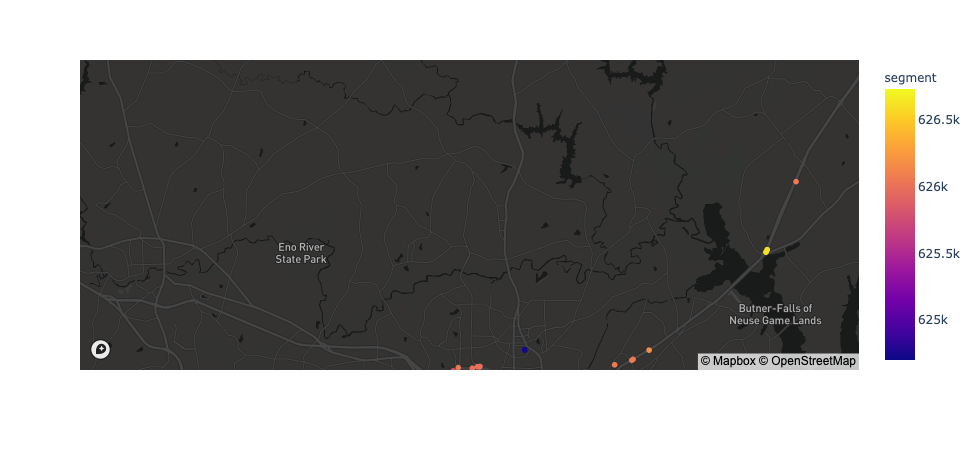

In [89]:
# low-quality device
plot_device(1457)

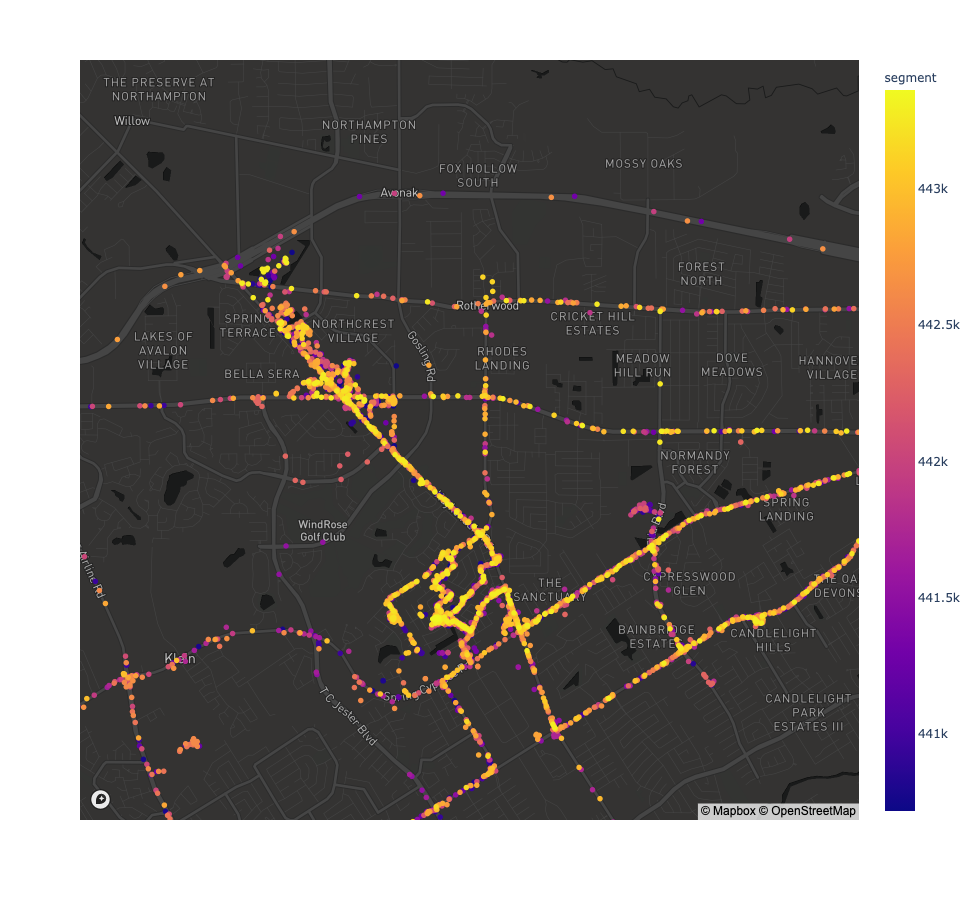

In [90]:
# high-quality device
plot_device(647)

The greatest difference between the high- and low-quality device from the plots above is observational density. The high-quality device has clear paths and clusters, whereas the low-quality device does not.

# Appendix: Trip Identification

## Segments

To begin, let's try to identify observational segments similarly to how one might identify a session for a web user. This is a simple first step toward trip identification.

In [5]:
diffs = df.groupby('device_id').apply(lambda grp: grp.ts.diff()).dt.total_seconds().div(60)

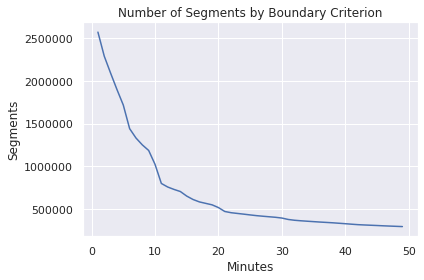

In [7]:
def compute_segments(minutes=3):
    return (diffs > minutes).sum() + 1

minutes = range(1,50)
segments = list()
for m in minutes:
    segments.append(compute_segments(m))

plt.plot(minutes, segments)
plt.title('Number of Segments by Boundary Criterion')
plt.xlabel('Minutes')
plt.ylabel('Segments')
plt.tight_layout()

There is a clear elbow at 11, so for now we'll go with that.

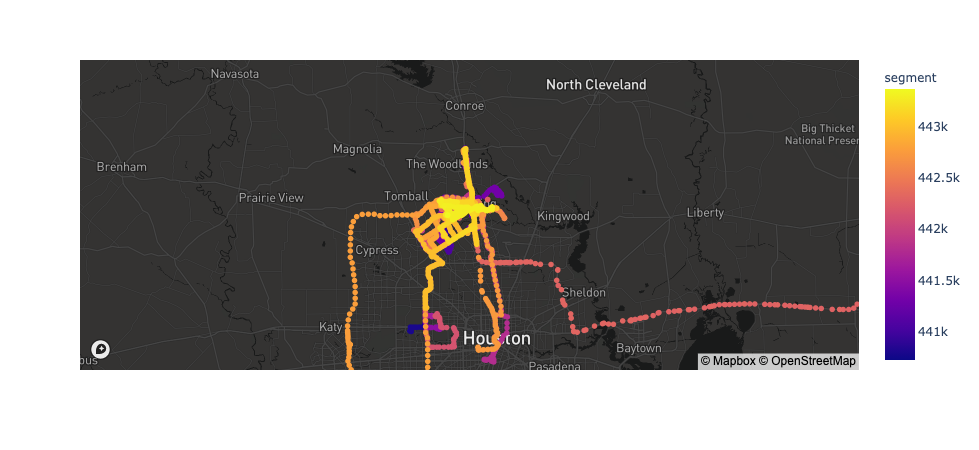

In [44]:
device_data = df.loc[df.device_id == 647]
fig = px.scatter_mapbox(
    device_data, 
    lon='lon', 
    lat='lat', 
    color='segment',
    hover_name='ts',
    mapbox_style='dark'
)
fig.show()

Although the segment method was successful at identifying a few trips, it is very coarse and rule-based. We can improve on it by using clustering.

## HDBSCAN

Below is a start at using HDBSCAN on lat/lon/time data to identify trips. It seems to work fairly well for the high-quality device 647 identified above, even noticing a side-trip to a golf course on the way back from Louisiana which was missed by the segment analysis.

In [169]:
# high-quality device
example = df.loc[df.device_id == 647, ['ts', 'lat', 'lon']]
example['epoch'] = example.ts.astype('int64')//1e9
example.pop('ts')
# example.pop('epoch')
example.head()

clust = hdbscan.HDBSCAN()
labels = clust.fit_predict(example)

example['label'] = labels

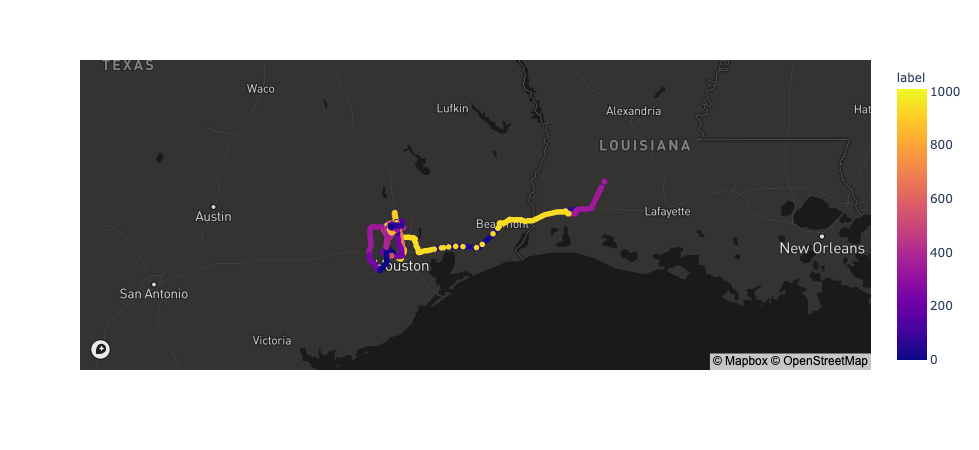

In [172]:
device_data = example
device_data['ts'] = df.loc[(df.device_id == 647), 'ts']
# device_data = device_data.loc[device_data.label == 1]
fig = px.scatter_mapbox(
    device_data, 
    lon='lon', 
    lat='lat', 
    color='label', #device_data['ts'].astype('int64')//1e9,
    hover_name='ts',
#     hover_data=['geohash5'],
#         color_continuous_scale=plotly.colors.sequential.tempo,
    mapbox_style='dark'
)
fig.show()